# Import Packages

In [1]:
# we utilize geoopt package for hyperbolic calculation
import geoopt.manifolds.stereographic.math as gmath

import glob
import random
import sys
import os
import matplotlib.pyplot as plt
import torch
from argparse import Namespace
import numpy as np
from tqdm import tqdm

# please specify the cuda devices
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "3"

# importing our model path
sys.path.insert(0,'/home/ll3504/GAN/HAE/Visualization/notebook_utils/hae')

# import updated pSp for inference
from models.hae_inference import hae

In [2]:
print(torch.__version__) # Get PyTorch and CUDA version
print(torch.cuda.is_available()) # Check that CUDA works
torch.cuda.device_count() # Check how many CUDA capable devices you have
torch.cuda.set_device(0)

1.12.1
True


# Load Models and Images

In [ ]:
# load model for different datasets

# animal faces
#model_path = 'PATH_TO/hae_animalfaces.pt'

# flowers 
model_path = 'PATH_TO/hae_flowers.pt'

# vgg faces
#model_path = 'PATH_TO/hae_vggfaces.pt'

ckpt = torch.load(model_path, map_location='cpu')
opts = ckpt['opts']
# use the first GPU normally
opts['device'] = 'cuda:0'
opts['checkpoint_path'] = model_path
if 'learn_in_w' not in opts:
    opts['learn_in_w'] = False

# instantialize model with checkpoints and args
opts = Namespace(**opts)
net = hae(opts)
net.eval()
net.cuda()
print('Model successfully loaded!')

In [4]:
from PIL import Image
import torchvision.transforms as transforms

# useful function for visualization
def tensor2im(var):
    var = var.cpu().detach().transpose(0, 2).transpose(0, 1).numpy()
    var = ((var + 1) / 2)
    var[var < 0] = 0
    var[var > 1] = 1
    var = var * 255
    return Image.fromarray(var.astype('uint8'))

# use default transform in training/inference

transform_inf = transforms.Compose([
                transforms.Resize((256, 256)),
                transforms.ToTensor(),
                transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])



In [5]:
# set manual seed only in this cell - choosing images manually is also available, please follow the same data type shown here
# sampling image
random.seed(55)
files = glob.glob("PATH_TO/animal_faces/*/*.jpg")
sampled_imgs = random.sample(files, 6)

#print(sampled_imgs)
image = []
for i in range(len(sampled_imgs)):        
    image.append(Image.open(sampled_imgs[i]).convert('RGB'))

['/proj/rcs-ssd/ll3504/datasets/animal_faces_eva/test/n02090622/n02090622_3865.JPEG_188_62_357_246.jpg', '/proj/rcs-ssd/ll3504/datasets/animal_faces_eva/test/n02138441/n02138441_10784.JPEG_280_46_567_183.jpg', '/proj/rcs-ssd/ll3504/datasets/animal_faces_eva/test/n02093647/n02093647_4627.JPEG_152_26_232_105.jpg', '/proj/rcs-ssd/ll3504/datasets/animal_faces_eva/test/n02088364/n02088364_232.JPEG_72_36_150_116.jpg', '/proj/rcs-ssd/ll3504/datasets/animal_faces_eva/test/n02090622/n02090622_245.JPEG_49_37_125_110.jpg', '/proj/rcs-ssd/ll3504/datasets/animal_faces_eva/test/n02138441/n02138441_5134.JPEG_112_82_310_241.jpg']


In [6]:
# this cell to transform input images to tensor
input_image = []
for i in image:
    input_image.append(transform_inf(i).cuda())
input_tensor = torch.stack(input_image)

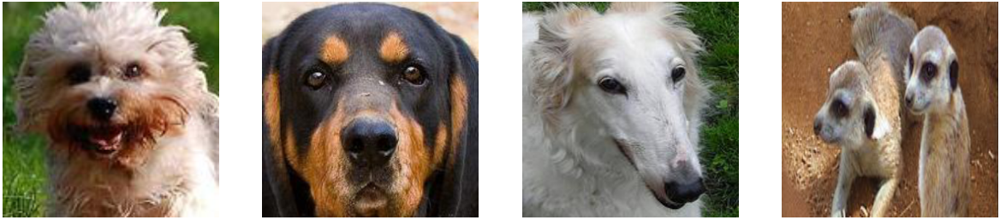

In [7]:
# show loaded images
%matplotlib inline  
fig = plt.figure(figsize = (50,20), dpi = 30)
gs = fig.add_gridspec(1, 4)
for i in range(4):
    fig.add_subplot(gs[0,i])
    plt.axis('off')
    plt.imshow(tensor2im(input_image[i].squeeze(0)))

#plt.savefig('/proj/rcs-ssd/ll3504/datasets/outputs/raw_animal_images_3.png',dpi = 300)

In [8]:
# important and necessary! to get the embeddings for further experiments
with torch.no_grad():
    images, logits, feature_dist, codes, feature_euc = net.forward(x = input_tensor, batch_size = 2, input_code = False)

/home/ll3504/GAN/HAE/Visualization/notebook_utils/psp/models/hyper_nets.py:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  k = torch.tensor(k)


## define necessary functions

In [ ]:
# rescale function
def rescale(target_radius, x):
    r_change = target_radius/dist0(gmath.mobius_scalar_mul(r = torch.tensor(1), x = x, k = torch.tensor(-1.0)))
    return gmath.mobius_scalar_mul(r = r_change, x = x, k = torch.tensor(-1.0))

# function for generating images with fixed radius (also contains raw geodesic images of 'shorten' images, and stretched images to boundary)
def geo_interpolate_fix_r(x,y,interval,target_radius):
    feature_geo = []
    feature_geo_normalized = []
    images_to_plot_raw_geo = []
    images_to_plot_target_radius = []
    images_to_plot_boundary = []
    dist_to_start = []
    target_radius_ratio = torch.tensor(target_radius/6.2126)
    geodesic_start_short = gmath.mobius_scalar_mul(r = target_radius_ratio, x = x, k = torch.tensor(-1.0))
    geodesic_end_short = gmath.mobius_scalar_mul(r = target_radius_ratio, x = y, k = torch.tensor(-1.0))
    for i in interval:
        # this is raw image on geodesic, instead of fixed radius
        feature_geo_current = gmath.geodesic(t = torch.tensor(i), x = geodesic_start_short, y = geodesic_end_short, k = torch.tensor(-1.0))

        # here we fix the radius and don't revert them now
        r_change = target_radius/dist0(gmath.mobius_scalar_mul(r = torch.tensor(1), x = feature_geo_current, k = torch.tensor(-1.0)))
        feature_geo.append(feature_geo_current)
        feature_geo_current_target_radius = gmath.mobius_scalar_mul(r = r_change, x = feature_geo_current, k = torch.tensor(-1.0))
        feature_geo_normalized.append(feature_geo_current_target_radius)
        dist = gmath.dist(geodesic_start_short, feature_geo_current_target_radius, k = torch.tensor(-1.0))
        dist_to_start.append(dist)

        # here is to revert the feature to boundary
        r_change_to_boundary = 6.2126/dist0(gmath.mobius_scalar_mul(r = torch.tensor(1), x = feature_geo_current, k = torch.tensor(-1.0)))
        feature_geo_current_target_boundary = gmath.mobius_scalar_mul(r = r_change_to_boundary, x = feature_geo_current, k = torch.tensor(-1.0))
        
        with torch.no_grad():
            image_raw_geo, _, _, _, _ = net.forward(x = feature_geo_current.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)
            image, _, _, _, _ = net.forward(x = feature_geo_current_target_radius.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)
            image_boundary, _, _, _, _ = net.forward(x = feature_geo_current_target_boundary.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)
        images_to_plot_raw_geo.append(image_raw_geo)
        images_to_plot_target_radius.append(image)
        images_to_plot_boundary.append(image_boundary)
    
    return images_to_plot_raw_geo, images_to_plot_target_radius, images_to_plot_boundary, dist_to_start

# function for generating images with fixed radius with optional latent codes list output

def geo_interpolate_fix_r_with_codes(x,y,interval,target_radius):
    # please use this with batch_size = 1
    feature_geo = []
    feature_geo_normalized = []
    images_to_plot_raw_geo = []
    images_to_plot_target_radius = []
    images_to_plot_boundary = []
    dist_to_start = []
    target_radius_ratio = torch.tensor(target_radius/6.2126)
    geodesic_start_short = gmath.mobius_scalar_mul(r = target_radius_ratio, x = x, k = torch.tensor(-1.0))
    geodesic_end_short = gmath.mobius_scalar_mul(r = target_radius_ratio, x = y, k = torch.tensor(-1.0))
    for i in interval:
        # this is raw image on geodesic, instead of fixed radius
        feature_geo_current = gmath.geodesic(t = torch.tensor(i), x = geodesic_start_short, y = geodesic_end_short, k = torch.tensor(-1.0))

        # here we fix the radius and don't revert them now
        r_change = target_radius/dist0(gmath.mobius_scalar_mul(r = torch.tensor(1), x = feature_geo_current, k = torch.tensor(-1.0)))
        feature_geo.append(feature_geo_current)
        feature_geo_current_target_radius = gmath.mobius_scalar_mul(r = r_change, x = feature_geo_current, k = torch.tensor(-1.0))
        feature_geo_normalized.append(feature_geo_current_target_radius)
        dist = gmath.dist(geodesic_start_short, feature_geo_current_target_radius, k = torch.tensor(-1.0))
        dist_to_start.append(dist)
        #print(feature_geo_current_target_radius.norm())

        # here is to revert the feature to boundary
        r_change_to_boundary = 6.2126/dist0(gmath.mobius_scalar_mul(r = torch.tensor(1), x = feature_geo_current, k = torch.tensor(-1.0)))
        feature_geo_current_target_boundary = gmath.mobius_scalar_mul(r = r_change_to_boundary, x = feature_geo_current, k = torch.tensor(-1.0))
        #print(feature_geo_current_target_boundary.norm())

        # now codes do not affect outputs
        with torch.no_grad():
            image_raw_geo, _, _, _, _ = net.forward(x = feature_geo_current.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)
            image, _, _, codes_target_radius, _ = net.forward(x = feature_geo_current_target_radius.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)
            image_boundary, _, _, codes_boundary, _ = net.forward(x = feature_geo_current_target_boundary.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)
        images_to_plot_raw_geo.append(image_raw_geo)
        images_to_plot_target_radius.append(image)
        images_to_plot_boundary.append(image_boundary)
    
    return images_to_plot_raw_geo, images_to_plot_target_radius, images_to_plot_boundary, dist_to_start, [codes_target_radius, codes_boundary, feature_geo_current_target_radius, feature_geo_current_target_boundary]

# the function defines easy perturbation on any given radius

def generate_perturbation_r_with_raw_inv(x, target_radius, interval, seed, size):
    # 3 arguments, raw image feature, target radius and interval(actually the ratio).
    images_perturbed = []
    dist_perturbed = []
    torch.manual_seed(seed = seed)
    perturb = torch.rand(6,512).cuda()
    for i in range(size):
        target_rad_perturb = 6.2126
        ratio = target_rad_perturb/dist0(perturb[i])
        perturb_current = gmath.mobius_scalar_mul(r = ratio, x = perturb[i], k = torch.tensor(-1.0))
        _, images_to_plot_target_radius, _, dist_to_start = geo_interpolate_fix_r(x = x,y = perturb_current, interval = interval ,target_radius = target_radius)
        print(dist_to_start)
        dist_perturbed.append(dist_to_start[0])
        images_perturbed.append(images_to_plot_target_radius[0])

    raw_image,_,_,_ = geo_interpolate_fix_r(x = x,y = perturb_current, interval = [0] ,target_radius = target_radius)
    images_perturbed.insert(0, raw_image[0])
    return images_perturbed, dist_perturbed

# this further function allows using specific target image as perturbation

def generate_perturbation_r_with_raw_inv_pick(x, y, target_radius, interval, seed):
    # 3 arguments, raw image feature, target radius and interval(actually the ratio).
    images_perturbed = []
    dist_perturbed = []
    torch.manual_seed(seed = seed)
    #perturb = torch.rand(6,512).cuda()
    perturb = y
    for i in range(len(y)):
        target_rad_perturb = 6.2126
        ratio = target_rad_perturb/dist0(perturb[i])
        perturb_current = gmath.mobius_scalar_mul(r = ratio, x = perturb[i], k = torch.tensor(-1.0))


        if False:
            with torch.no_grad():
                image, _, _, _, _ = net.forward(x = perturb_current.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)
            
            fig = plt.figure(figsize = (5,5))
            gs = fig.add_gridspec(1, 1)
            for i in range(1):
                if i == 0:
                    fig.add_subplot(gs[0,i])
                    plt.axis('off')
                    plt.title(f'perturb = {target_rad_perturb}')
                    plt.imshow(tensor2im(image.squeeze(0)))

        #interval = [0.42]
        _, images_to_plot_target_radius, _, dist_to_start = geo_interpolate_fix_r(x = x,y = perturb_current, interval = interval ,target_radius = target_radius)
        print(dist_to_start)
        dist_perturbed.append(dist_to_start[0])
        images_perturbed.append(images_to_plot_target_radius[0])

    raw_image,_,_,_ = geo_interpolate_fix_r(x = x,y = perturb_current, interval = [0] ,target_radius = target_radius)
    images_perturbed.insert(0, raw_image[0])
    return images_perturbed, dist_perturbed

# Tree-like pic generation

Please note, by default, we need 8 images in this experiment. Therefore, please make sure images list contain 8 images!

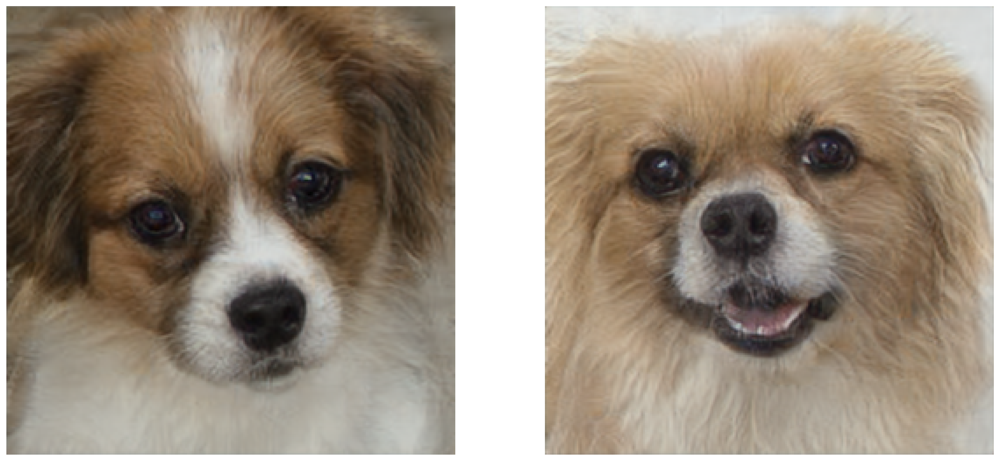

In [13]:
%matplotlib inline  
fig = plt.figure(figsize = (20,40), dpi = 300)
gs = fig.add_gridspec(1, 2)
for i in range(2):
    fig.add_subplot(gs[0,i])
    plt.axis('off')
    plt.imshow(tensor2im(images[i].squeeze(0)))
#plt.savefig('/proj/rcs-ssd/ll3504/datasets/outputs/inversion_8_images.png',dpi = 300)

In [ ]:
# plot all 8 images and save

%matplotlib inline  
fig = plt.figure(figsize = (20,80), dpi = 300)
gs = fig.add_gridspec(1, 8)
for i in range(8):
    fig.add_subplot(gs[0,i])
    plt.axis('off')
    plt.imshow(tensor2im(images[i].squeeze(0)))
plt.savefig('/proj/rcs-ssd/ll3504/datasets/outputs/inversion_8_images.png',dpi = 300)

In [16]:
# calculate pair-wise distance between images
dist_pairwise = torch.zeros(8,8)
for i in range(8):
    for j in range(8):
        dist_pairwise[i,j] = gmath.dist(x = feature_dist[i], y = feature_dist[j], k = torch.tensor(-1.0))

Text(0.5, 1.0, 'distance between images')

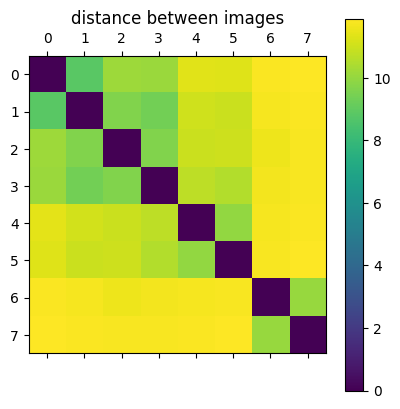

In [17]:
plt.matshow(dist_pairwise)
plt.colorbar()
plt.title('distance between images')

In [37]:
# save mean of paired images, we assume there are three layers while merging, here is layer1
mean_l1_raw = []
mean_l1_rescale = []
images_to_plot = []
images_to_raw = []

radius = 6.2126

for i in range(4):
    current_mean = poincare_mean(x = torch.stack([feature_dist[i*2],feature_dist[i*2+1]]))
    mean_l1_raw.append(current_mean)
    print(dist0(current_mean))
    current_mean_rescale = rescale(4, current_mean)
    mean_l1_rescale.append(current_mean_rescale)
    
    with torch.no_grad():
        image, _, _, _, _ = net.forward(x = current_mean_rescale.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)
        image_raw, _, _, _, _ = net.forward(x = current_mean.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)

    images_to_plot.append(image)
    images_to_raw.append(image_raw)
    

tensor(2.4829, device='cuda:0')
tensor(2.0688, device='cuda:0')
tensor(1.9085, device='cuda:0')
tensor(1.8612, device='cuda:0')


In [38]:
# save mean of paired images for layer 2
mean_l2_raw = []
mean_l2_rescale = []
images_to_plot_l2 = []
images_to_raw_l2 = []

radius = 6.2126

for i in range(2):
    current_mean = poincare_mean(x = torch.stack([mean_l1_raw[i*2],mean_l1_raw[i*2+1]]))
    mean_l2_raw.append(current_mean)
    print(dist0(current_mean))
    current_mean_rescale = rescale(2.5, current_mean)
    mean_l2_rescale.append(current_mean_rescale)
    
    with torch.no_grad():
        image, _, _, _, _ = net.forward(x = current_mean_rescale.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)
        image_raw, _, _, _, _ = net.forward(x = current_mean.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)

    images_to_plot_l2.append(image)
    images_to_raw_l2.append(image_raw)

tensor(1.8549, device='cuda:0')
tensor(0.7725, device='cuda:0')


In [39]:
# save mean of paired images for layer 3
mean_l3_raw = []
mean_l3_rescale = []
images_to_plot_l3 = []
images_to_raw_l3 = []

radius = 6.2126

for i in range(1):
    current_mean = poincare_mean(x = torch.stack([mean_l2_raw[i*2],mean_l2_raw[i*2+1]]))
    mean_l3_raw.append(current_mean)
    
    current_mean_rescale = rescale(2.5, current_mean)
    mean_l3_rescale.append(current_mean_rescale)
    
    with torch.no_grad():
        image, _, _, _, _ = net.forward(x = current_mean_rescale.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)
        image_raw, _, _, _, _ = net.forward(x = current_mean.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)
        
    images_to_plot_l3.append(image)
    images_to_raw_l3.append(image_raw)

In [41]:
# final plot for all 3 layers

fig, ax = plt.subplots(3, 4, figsize = (40, 30), dpi = 300)

for row in [0]:
    for col in range(4):

        ax[row][col].tick_params(top = 'off', bottom = 'off', left = 'off', right = 'off', labelleft = 'on', labelbottom = 'on')
        ax[row][col].imshow(tensor2im(images_to_plot[col].squeeze(0)))
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])
        #ax[row][col].set_xlabel('x label')
        if col == 0:
            ax[row][col].set_ylabel('Layer 1')
            
for row in [1]:
    for col in range(2):

        ax[row][col].tick_params(top = 'off', bottom = 'off', left = 'off', right = 'off', labelleft = 'on', labelbottom = 'on')
        ax[row][col].imshow(tensor2im(images_to_plot_l2[col].squeeze(0)))
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])
        #ax[row][col].set_xlabel('x label')
        if col == 0:
            ax[row][col].set_ylabel('Layer 2')
            
for row in [2]:
    for col in range(1):
        ax[row][col].tick_params(top = 'off', bottom = 'off', left = 'off', right = 'off', labelleft = 'on', labelbottom = 'on')
        ax[row][col].imshow(tensor2im(images_to_plot_l3[col].squeeze(0)))
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])
        #ax[row][col].set_xlabel('x label')
        if col == 0:
            ax[row][col].set_ylabel('Layer 3')

plt.savefig('/proj/rcs-ssd/ll3504/datasets/outputs/merged_images_layer1_r4_layer2_r2.png',dpi = 300)

# Perturbation

In [3]:
# try to sample a noise and rescale it to the target radius, the input will be: one source picture feature_dist (1*512 dim), perturbation feature_dist (n*512 dim) ,
# target radius (float <= 6.2126)
# and desired interval, ranging from 0 to 1.


In [ ]:
images_r6, dist_r6 = generate_perturbation_r_with_raw_inv_pick(x = feature_dist[0], y=feature_dist[1:], target_radius = 6.2126, interval = [0.47], seed = 46)
images_r5, dist_r5 = generate_perturbation_r_with_raw_inv_pick(x = feature_dist[0], y=feature_dist[1:], target_radius = 5, interval = [0.49], seed = 48)
images_r4, dist_r4 = generate_perturbation_r_with_raw_inv_pick(x = feature_dist[0], y=feature_dist[1:], target_radius = 4, interval = [0.51], seed = 53)
images_r3, dist_r3 = generate_perturbation_r_with_raw_inv_pick(x = feature_dist[0], y=feature_dist[1:], target_radius = 3, interval = [0.9], seed = 100)

In [11]:
images_r6, dist_r6 = generate_perturbation_r_with_raw_inv(x = feature_dist[0], target_radius = 6.2126, interval = [0.445], seed = 52, size=6)
images_r5, dist_r5 = generate_perturbation_r_with_raw_inv(x = feature_dist[0], target_radius = 5, interval = [0.46], seed = 52, size=6)
images_r4, dist_r4 = generate_perturbation_r_with_raw_inv(x = feature_dist[0], target_radius = 4, interval = [0.47], seed = 52, size=6)
images_r3, dist_r3 = generate_perturbation_r_with_raw_inv(x = feature_dist[0], target_radius = 3, interval = [0.99], seed = 52, size=6)

[tensor(11.0748, device='cuda:0')]
[tensor(11.2040, device='cuda:0')]
[tensor(11.1611, device='cuda:0')]
[tensor(11.1445, device='cuda:0')]
[tensor(11.1121, device='cuda:0')]
[tensor(11.1675, device='cuda:0')]
[tensor(8.8117, device='cuda:0')]
[tensor(8.8852, device='cuda:0')]
[tensor(8.8915, device='cuda:0')]
[tensor(8.8210, device='cuda:0')]
[tensor(8.8352, device='cuda:0')]
[tensor(8.8686, device='cuda:0')]
[tensor(6.8125, device='cuda:0')]
[tensor(6.8872, device='cuda:0')]
[tensor(6.8954, device='cuda:0')]
[tensor(6.8230, device='cuda:0')]
[tensor(6.8366, device='cuda:0')]
[tensor(6.8714, device='cuda:0')]
[tensor(5.2822, device='cuda:0')]
[tensor(5.3419, device='cuda:0')]
[tensor(5.3483, device='cuda:0')]
[tensor(5.2906, device='cuda:0')]
[tensor(5.3016, device='cuda:0')]
[tensor(5.3293, device='cuda:0')]


In [15]:
def plot_one_row_with_dist(images, dist, radius):
    for col in range(len(images)):
        ax[row][col].tick_params(top = 'off', bottom = 'off', left = 'off', right = 'off', labelleft = 'on', labelbottom = 'on')
        '''
        if col == 0:
            ax[row][col].set_title('Inversion', fontsize = 16)
        else:
            ax[row][col].set_title('$d_i = %.2f$' % dist[col-1], fontsize = 16)
            '''
        ax[row][col].imshow(tensor2im(images[col].squeeze(0)))
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])
        #ax[row][col].set_xlabel('x label')
        if col == 0:
            ax[row][col].set_ylabel(f'$target radius = {radius}$', fontsize = 28)
    return None

In [76]:
fig, ax = plt.subplots(4, len(images_r6), figsize = (40, 25),dpi = 500)

for row in [0]:
   plot_one_row_with_dist(images_r6, dist_r6, radius = 6)
for row in [1]:
   plot_one_row_with_dist(images_r5, dist_r5, radius = 5) 
for row in [2]:
   plot_one_row_with_dist(images_r4, dist_r4, radius = 4)
for row in [3]:
   plot_one_row_with_dist(images_r3, dist_r3, radius = 3)
fig.tight_layout()

plt.savefig('/proj/rcs-ssd/ll3504/datasets/outputs/perturbation_flowers_25.png',dpi = 500)

# Interpolation

In [492]:
# we calculate several points along the geodesic connecting two given points
# just use this for arbitrary radius, also we can project the images back to boundary (not necessary)
interval = [0,0.475,0.49,0.51,0.535,0.55,1]
_,images_to_plot_r1, feature_geo_boundary, _ = geo_interpolate_fix_r(feature_dist[8], feature_dist[7], interval,target_radius = 6.2126)
images_to_plot_r1.insert(0,input_image[8])
images_to_plot_r1.insert(len(images_to_plot_r1),input_image[7])

In [61]:
# for W+space interpolation only
interval = [1, 0.8, 0.6, 0.4, 0.2, 0]
images_to_plot = interpolation_codes(codes[0], codes[1], interval)
images_to_plot.insert(0,input_image[0])
images_to_plot.insert(len(images_to_plot),input_image[1])

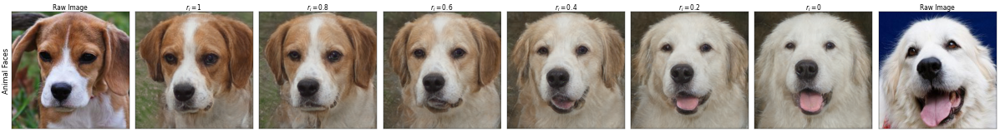

In [62]:
%matplotlib inline  
# plot interpolation with original images for codes
fig, ax = plt.subplots(1, len(interval)+2, figsize = (40, 10), dpi = 30)

for row in [0]:
    for col in range(len(interval)+2):
        if col == 0 or col == len(interval)+1 :
            ax[col].set_title(f'Raw Image', fontsize = 18)
        if col not in [0,len(interval)+1]:
            ax[col].set_title(f'$r_i = {interval[col-1]}$', fontsize = 18)
        ax[col].tick_params(top = 'off', bottom = 'off', left = 'off', right = 'off', labelleft = 'on', labelbottom = 'on')
        ax[col].imshow(tensor2im(images_to_plot[col].squeeze(0)))
        ax[col].set_xticks([])
        ax[col].set_yticks([])
        #ax[row][col].set_xlabel('x label')
        if col == 0:
            ax[col].set_ylabel(f'Animal Faces', fontsize = 20)
fig.tight_layout()            
#plt.savefig('/proj/rcs-ssd/ll3504/datasets/outputs/interpolation_animals2',dpi = 300)

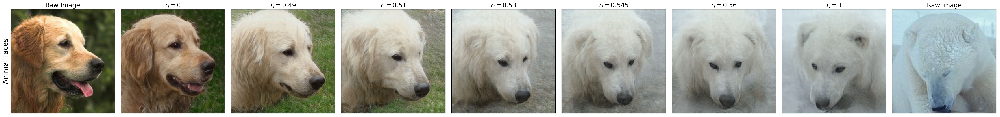

In [378]:
%matplotlib inline  
# plot interpolation with original images
fig, ax = plt.subplots(1, len(interval)+2, figsize = (40, 10), dpi = 300)

for row in [0]:
    for col in range(len(interval)+2):
        if col == 0 or col == len(interval)+1 :
            ax[col].set_title(f'Raw Image', fontsize = 18)
        if col not in [0,len(interval)+1]:
            ax[col].set_title(f'$r_i = {interval[col-1]}$', fontsize = 18)
        ax[col].tick_params(top = 'off', bottom = 'off', left = 'off', right = 'off', labelleft = 'on', labelbottom = 'on')
        ax[col].imshow(tensor2im(images_to_plot_r1[col].squeeze(0)))
        ax[col].set_xticks([])
        ax[col].set_yticks([])
        #ax[row][col].set_xlabel('x label')
        if col == 0:
            ax[col].set_ylabel(f'Animal Faces', fontsize = 20)
fig.tight_layout()            
plt.savefig('/proj/rcs-ssd/ll3504/datasets/outputs/interpolation_animals_1',dpi = 300)

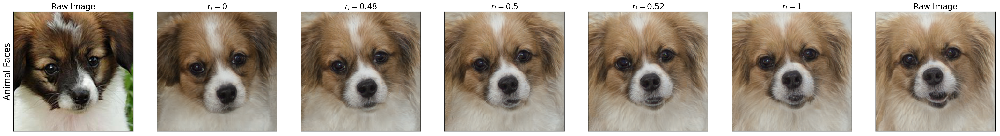

In [116]:
%matplotlib inline  
# plot interpolation with original images, here r = 4!
fig, ax = plt.subplots(1, len(interval)+2, figsize = (40, 10), dpi = 300)

for row in [0]:
    for col in range(len(interval)+2):
        if col == 0 or col == len(interval)+1 :
            ax[col].set_title(f'Raw Image', fontsize = 18)
        if col not in [0,len(interval)+1]:
            ax[col].set_title(f'$r_i = {interval[col-1]}$', fontsize = 18)
        ax[col].tick_params(top = 'off', bottom = 'off', left = 'off', right = 'off', labelleft = 'on', labelbottom = 'on')
        ax[col].imshow(tensor2im(images_to_plot_r1[col].squeeze(0)))
        ax[col].set_xticks([])
        ax[col].set_yticks([])
        #ax[row][col].set_xlabel('x label')
        if col == 0:
            ax[col].set_ylabel(f'Animal Faces', fontsize = 20)
            
#plt.savefig('/proj/rcs-ssd/ll3504/datasets/outputs/interpolation_chihuahua_leopard',dpi = 300)

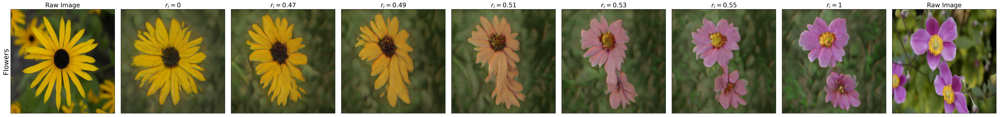

In [420]:
%matplotlib inline  
# plot interpolation with original images
fig, ax = plt.subplots(1, len(interval)+2, figsize = (40, 10), dpi = 300)

for row in [0]:
    for col in range(len(interval)+2):
        if col == 0 or col == len(interval)+1 :
            ax[col].set_title(f'Raw Image', fontsize = 18)
        if col not in [0,len(interval)+1]:
            ax[col].set_title(f'$r_i = {interval[col-1]}$', fontsize = 18)
        ax[col].tick_params(top = 'off', bottom = 'off', left = 'off', right = 'off', labelleft = 'on', labelbottom = 'on')
        ax[col].imshow(tensor2im(images_to_plot_r1[col].squeeze(0)))
        ax[col].set_xticks([])
        ax[col].set_yticks([])
        #ax[row][col].set_xlabel('x label')
        if col == 0:
            ax[col].set_ylabel(f'Flowers', fontsize = 20)

fig.tight_layout()            
plt.savefig('/proj/rcs-ssd/ll3504/datasets/outputs/interpolation_flowers_1',dpi = 300)

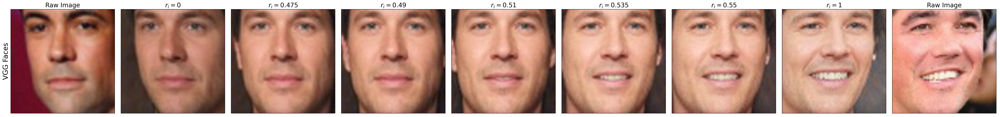

In [493]:
%matplotlib inline  
# plot interpolation with original images
fig, ax = plt.subplots(1, len(interval)+2, figsize = (40, 10), dpi = 300)

for row in [0]:
    for col in range(len(interval)+2):
        if col == 0 or col == len(interval)+1 :
            ax[col].set_title(f'Raw Image', fontsize = 18)
        if col not in [0,len(interval)+1]:
            ax[col].set_title(f'$r_i = {interval[col-1]}$', fontsize = 18)
        ax[col].tick_params(top = 'off', bottom = 'off', left = 'off', right = 'off', labelleft = 'on', labelbottom = 'on')
        ax[col].imshow(tensor2im(images_to_plot_r1[col].squeeze(0)))
        ax[col].set_xticks([])
        ax[col].set_yticks([])
        #ax[row][col].set_xlabel('x label')
        if col == 0:
            ax[col].set_ylabel(f'VGG Faces', fontsize = 20)

fig.tight_layout()
plt.savefig('/proj/rcs-ssd/ll3504/datasets/outputs/interpolation_faces_1',dpi = 300)

# Fixing Image, Varying Radius

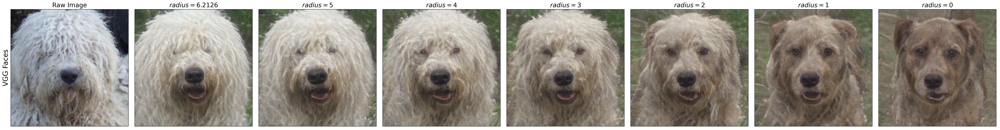

In [514]:
# this is used for generating figure of varying radius in our paper
images_to_plot = []
target_radii = [6.2126, 5, 4, 3, 2, 1, 0]
for i in target_radii:
    feature_rescaled = rescale(i, feature_dist[12])
    #print(feature_rescaled.norm())
    with torch.no_grad():
        image, _, _, _, _ = net.forward(x = feature_rescaled.unsqueeze(0), codes=None, batch_size = 1, input_feature=True, input_code = False)
    images_to_plot.append(image)

images_to_plot.insert(0,input_image[12])

fig, ax = plt.subplots(1, len(images_to_plot), figsize = (40, 10), dpi = 300)

for row in [0]:
    for col in range(len(images_to_plot)):
        if col == 0:
            ax[col].set_title(f'Raw Image', fontsize = 18)
        else:
            ax[col].set_title(f'$radius = {target_radii[col-1]}$', fontsize = 18)
        ax[col].tick_params(top = 'off', bottom = 'off', left = 'off', right = 'off', labelleft = 'on', labelbottom = 'on')
        ax[col].imshow(tensor2im(images_to_plot[col].squeeze(0)))
        ax[col].set_xticks([])
        ax[col].set_yticks([])
        #ax[row][col].set_xlabel('x label')
        if col == 0:
            ax[col].set_ylabel(f'VGG Faces', fontsize = 20)
fig.tight_layout()
plt.savefig('/proj/rcs-ssd/ll3504/datasets/outputs/radius_animals_6',dpi = 300)

# Image Generation for FID evaluation

This section generates image for downstream task (FID evaluation) with randomly chosen images 

In [7]:
#set manual seed only in this cell -
random.seed(47)
files = glob.glob("/proj/rcs-ssd/ll3504/datasets/animal_faces/*/*.jpg")
sampled_imgs = random.sample(files, 100)
#print(sampled_imgs)
image = []
for i in range(len(sampled_imgs)):        
    image.append(Image.open(sampled_imgs[i]).convert('RGB'))

In [45]:
# to make each image with the same perturbation, we need to fix it before run the function over again, here only 1 perturbation will be generated!
def generate_1_perturbation_r_with_raw_inv(x, target_radius, interval, perturb):
    # (optional 4) 3 arguments, raw image feature, target radius and interval(actually the ratio).
    perturb = perturb 
    target_rad_perturb = 6.2126
    ratio = target_rad_perturb/dist0(perturb)

    perturb_current = gmath.mobius_scalar_mul(r = ratio, x = perturb, k = torch.tensor(-1.0))
    _, images_to_plot_target_radius, images_to_plot_boundary, dist_to_start, codes_perturb = geo_interpolate_fix_r_with_codes(x = x,y = perturb_current, interval = interval ,target_radius = target_radius)
    #codes_target_radius, codes_boundary, feature_target_radius, feature_boundary = codes_perturb
    #print(dist_to_start,codes_target_radius, codes_boundary, feature_target_radius, feature_boundary)
    
    # give inversion of target radius
    inversion,_,_,_ ,codes_inv = geo_interpolate_fix_r_with_codes(x = x,y = perturb_current, interval = [0] ,target_radius = target_radius)
    # inv_codes_target_radius, inv_codes_boundary, inv_feature_target_radius, inv_feature_boundary
    
    return images_to_plot_boundary, images_to_plot_target_radius, inversion, codes_perturb, codes_inv

In [9]:
import numpy as np
from tqdm import tqdm
torch.manual_seed(seed = 45)

i = 1
# speficy datasets, choosing from animals, flowers and faces
dataset_name = 'animals'
radius = [6, 5.5, 5, 4.5, 4, 3.5, 3]
interval = [0.42, 0.437, 0.45, 0.475, 0.49, 0.55, 0.7]
distances = list_three = np.zeros((len(radius), 18, len(image)), dtype = float)
for img in tqdm(image):
    input_image = transform_inf(img).cuda()
    # here, we set the random purturb to be equal for one image and its re-scaled variants (and will change for the next image)
    perturb = torch.rand(512).cuda()
    with torch.no_grad():
        image_inversion, logits, feature_dist, codes, feature_euc = net.forward(x = input_image.unsqueeze(0), batch_size = 1, input_code = False)   
    for j in range(len(radius)):
        
        img_perturb_boundary, img_perturb, inversion, codes_perturb, codes_inv = generate_1_perturbation_r_with_raw_inv(feature_dist.squeeze(0), radius[j], [interval[j]],perturb)
        '''
        img_perturb_boundary = tensor2im(img_perturb_boundary[0].squeeze(0))
        img_perturb_boundary.save(f'/proj/rcs-ssd/ll3504/datasets/outputs/{dataset_name}/perturbation_r{radius[j]}_boundary/{i}.jpg')
        
        img_perturb = tensor2im(img_perturb[0].squeeze(0))
        img_perturb.save(f'/proj/rcs-ssd/ll3504/datasets/outputs/{dataset_name}/perturbation_r{radius[j]}/{i}.jpg')
        
        inversion = tensor2im(inversion[0].squeeze(0))
        inversion.save(f'/proj/rcs-ssd/ll3504/datasets/outputs/{dataset_name}/inversion_r{radius[j]}/{i}.jpg')
        '''
        for m in range(18):
            distances[j][m][i-1] = np.linalg.norm(codes_perturb[1].squeeze()[m].cpu().detach().numpy()-codes_inv[1].squeeze()[m].cpu().detach().numpy())    
        
    i = i+1

#print(distances)
avrage_distances = np.mean(distances, axis=2)
avrage_distances = np.mean(avrage_distances, axis=1)


        

  0%|          | 0/100 [00:00<?, ?it/s]/home/ll3504/GAN/localbasis/models/psp/models/hyrnn_nets.py:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  k = torch.tensor(k)
100%|██████████| 100/100 [02:00<00:00,  1.20s/it]


In [17]:
# additional illustration for calculating distances between images

distance = list(avrage_distances)
#plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = "12"
fig, ax = plt.subplots(1, 1, figsize = (5, 3), dpi=320)
ax.bar(radius, distance, width = 0.3, color = "steelblue")
ax.set_xlim((2.5, 6.5))
ax.set_ylim((0, 4))
ax.set_xlabel('Hyperbolic Radius')
ax.set_ylabel('L2 Distance')
ax.set_xticks(radius)
plt.subplots_adjust(bottom=0.2)
plt.savefig('/proj/rcs-ssd/ll3504/datasets/outputs/distances1.png', dpi=320)
plt.show()

# Few-shot Generation for Classification

## Preparation: Creating folders to save images - animal faces for example

In [47]:
# take datasets
folders = glob.glob("/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train/*")
root = '/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train_aug/'
# set radii of perturbation to be saved, where boundary means re-scale
radius = [6, 5.5, 5, 4.5, 4, 3.5, 3]
for i in radius:
    os.makedirs(root+f'perturbation_r{i}')
    os.makedirs(root+f'perturbation_r{i}_boundary')
    os.makedirs(root+f'inversion_r{i}')
os.makedirs(root+f'raw')
folders = glob.glob("/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train/*")

# recording class names, normally unseen ones
class_names = []
for i in folders:
    i = i[-9:]
    class_names.append(i)

# create augmentation folders
aug_folders = glob.glob("/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train_aug/*")

for folder in aug_folders:
    for class_name in class_names:
        os.makedirs(folder+'/'+class_name)

## Generating

In [60]:
radius = [6, 5.5, 5, 4.5, 4, 3.5, 3]
interval = [0.42, 0.437, 0.45, 0.475, 0.49, 0.57, 0.7]

for class_name in class_names:
    files = glob.glob(f"/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train/{class_name}/*.jpg")
    # sampled_imgs = random.sample(files, 2)
    for img in tqdm(files):   
        input_image = Image.open(img).convert('RGB')
        input_image = transform_inf(input_image).cuda()
        raw_img_rescale = tensor2im(input_image)
        # save re-sized raw image
        img_title = img.split('/')[-1][:-4]
        #raw_img_rescale.save(f'/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train_aug/raw/{class_name}/{img_title}.jpg')
        if not os.path.exists('/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train_aug/raw_fid'):
            os.makedirs('/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train_aug/raw_fid')
        raw_img_rescale.save(f'/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train_aug/raw_fid/{img_title}.jpg')
        # here, we set several images from seen data as perturbations
        sampled_perturbs = random.sample(perturb_candidates, 1)
        # get the feature_dist of input image
        with torch.no_grad():
            image_inversion, logits, feature_dist, codes, feature_euc = net.forward(x = input_image.unsqueeze(0), batch_size = 1, input_code = False)   
            
        # for naming multiple perturb    
        perturb_count = 0
        for perturb in sampled_perturbs:
            perturb_count = perturb_count + 1
            input_perturb = Image.open(perturb).convert('RGB')
            input_perturb = transform_inf(input_perturb).cuda()
            # get the feature_dist of perturb
            with torch.no_grad():
                perturb_inversion, _, feature_dist_perturb, _,_ = net.forward(x = input_perturb.unsqueeze(0), batch_size = 1, input_code = False)   

            for j in range(len(radius)):

                img_perturb_boundary, img_perturb, inversion, codes_perturb, codes_inv = generate_1_perturbation_r_with_raw_inv(feature_dist.squeeze(0), radius[j], [interval[j]],feature_dist_perturb.squeeze(0))

                img_perturb_boundary = tensor2im(img_perturb_boundary[0].squeeze(0))
                #img_perturb_boundary.save(f'/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train_aug/perturbation_r{radius[j]}_boundary/{class_name}/{img_title}_{perturb_count}.jpg')
                if not os.path.exists(f'/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train_aug/perturbation_r{radius[j]}_boundary_fid'):
                    os.makedirs(f'/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train_aug/perturbation_r{radius[j]}_boundary_fid')
                img_perturb_boundary.save(f'/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train_aug/perturbation_r{radius[j]}_boundary_fid/{img_title}.jpg')

                #img_perturb = tensor2im(img_perturb[0].squeeze(0))
                #img_perturb.save(f'/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train_aug/perturbation_r{radius[j]}/{class_name}/{img_title}_{perturb_count}.jpg')

                #inversion = tensor2im(inversion[0].squeeze(0))
                #inversion.save(f'/proj/rcs-ssd/ll3504/datasets/animal_faces_unseen/train_aug/inversion_r{radius[j]}/{class_name}/{img_title}_{perturb_count}.jpg')


100%|██████████| 30/30 [01:16<00:00,  2.56s/it]
